# IPyPublish - Notebook conversion

*Note: this notebook should be converted to PDF with the following command:*

```
nbpublish -pdf <notebook-name>.ipynb
```


*You can also add the `-f nbpublish_config.json` parameter and customize the `.json` file. You have to install [IPyPublish](https://ipypublish.readthedocs.io/en/latest/index.html) first. Also note that this cell will not be part of the output since it contains the following metadata:*

```
{
    "ipub": {
        "ignore": true
    }
}
```

# Initialization

Rationale: import everything here, define generic plot params, define utility functions.

## Plot parameters

In [1]:
# https://stackoverflow.com/a/39566040/11552622
rcparams = {
    'axes.titlesize':13,
    'axes.labelsize':9,
    'xtick.labelsize':8,
    'ytick.labelsize':8
}

## Imports

In [153]:
import numpy as np
import seaborn as sns
from matplotlib.gridspec import GridSpec

In [126]:
# IPyPublish customization of matplotlib.pyplot and pandas
from ipypublish import nb_setup
plt = nb_setup.setup_matplotlib(output=('pdf','svg'), rcparams=rcparams)
pd = nb_setup.setup_pandas(escape_latex=False)

In [4]:
# Float display precision
pd.set_option('precision', 2)

## Path setup

In [5]:
file_names = {
    # Results summary table
    'table': 'table.csv', 
    # Hemodynamic parameters
    'Xexact': 'Xexact.csv', 'Xpred':'Xpredicted.csv',
    # DNN responses
    'Ytest':'Ytest.txt', 'Ypred':'Ytestpred.txt'
}

In [6]:
prefix = '/media/maousi/Data/tmp/'
suffix = '/results/'
results_folders = {
    # Boolean: artificial pulse
    False: {
        # Integer: RPM
        4000: 'simulations_2020_03_21',
        5000: 'simulation_LVAD_RPM5000_2020_04_21',
        6000: 'simulation_LVAD_RPM6000_2020_04_22',
        # Convention: put the simulations without LVAD here, i.e. RPM=0
        0:    'simulation_noLVAD_2020_04_15'
    },
    True: {
        # Integer: RPM
        4000: 'simulation_LVAD_RPM4000_Pulse_T30_N2000_2020_04_26',
        5000: 'simulation_LVAD_RPM5000_Pulse_T30_N2000_2020_04_26',
        6000: 'simulation_LVAD_RPM6000_Pulse_T30_N2000_2020_04_26'
    }
}
for ap, dic in results_folders.items():
    for rpm, path in dic.items():
        dic[rpm] = prefix+path+suffix

## Utility functions

### Results tables



In [7]:
# Define utility function to format results table
def format_table(table):
    table.index = [
        'Min exact', 'Max exact', 'Mean exact', 'SD exact', 'Min predicted', 
        'Max predicted', 'Mean predicted', 'SD predicted', 'Mean error matrix', 
        'Mean rel error * 100', 'SD error', 'CI min', 'CI max',
    ]
    table.columns = [
        'HR','SAPM','SAPS','SAPD', 'PAPM','PAPS','PAPD','LVEF',
        'LVEDV', 'LVESV', 'CI', 'PCPW'
    ]
    # Multiply relative error by 100
    table.loc['Mean rel error * 100', :] = table.loc['Mean rel error * 100', :] * 100

In [8]:
# Load the table, format it and return it
def get_results_table(artificial_pulse, RPM):
    """
    :param artificial_pulse: bool
    :param RPM: int
    """
    df = pd.read_csv(
        results_folders[artificial_pulse][RPM] + file_names['table'], 
        header=None
    )
    format_table(df)
    return df

### DNN performance

In [9]:
# Column names
dnnperf_params_ = ['Emax', 'Emax0', 'G_Emax', 'k_E']

In [10]:
# For plots
dnnperf_params = [r'$E_{max,lv}$', r'$E_{max,lv,0}$',
                  r'$G_{E_{max,lv}}$', r'$k_{E,lv}$']

In [11]:
def load_Ys(ap, RPM):
    Ytest = pd.read_csv(results_folders[ap][RPM]
                        + file_names['Ytest'], sep=' ', header=None)
    Ytestpred = pd.read_csv(results_folders[ap][RPM]
                            +file_names['Ypred'], sep=' ', header=None)
    Ytest.columns = dnnperf_params_
    Ytestpred.columns = dnnperf_params_
    return Ytest, Ytestpred

In [16]:
def plot_dnn_performance(artificial_pulse, RPM):
    
    fig, ax = plt.subplots(2, 2, figsize=(10,6))
    axlst = ax.ravel()
    Ytest, Ypred = load_Ys(artificial_pulse, RPM)
    
    for i,col in enumerate(dnnperf_params_):
        axlst[i].scatter(Ytest.loc[:, col], Ypred.loc[:, col], s=3)
        axlst[i].set_title(dnnperf_params[i])
        axlst[i].set_xlabel(r'Exact')
        axlst[i].set_ylabel(r'Predicted')
    
    offset = .0005
    ax[1, 1].set_xlim([Ytest.loc[:, 'k_E'].min()-offset, Ytest.loc[:, 'k_E'].max()+offset])
    ax[1, 1].set_ylim([Ypred.loc[:, 'k_E'].min()-offset, Ypred.loc[:, 'k_E'].max()+offset])
    
    plt.subplots_adjust(wspace=0.3, hspace=.5)

# Introduction

## Aim

Compare DNN test simulations with and without Heart Mate III Artificial Pulse feature.

## Considerations

### Pulsatile vs continuous flow

The simulations with the Artificial Pulse were performed on a longer simulation time (30s) compared to continuous-flow simulations (20s), since pulsatile simulation signals take a little longer to stabilize. The number of intervals were also increased to 2000 for pulsatile flow (vs 500 for continuous-flow).

Thus, there are more Fourier coefficients and the DNN input size is bigger for pulsatile flow.

# Artificial Pulse results

## RPM = 4000

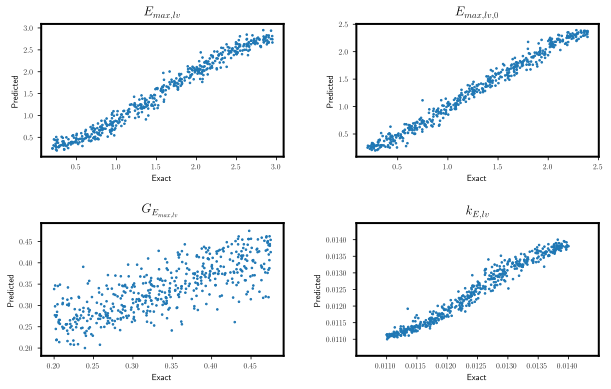

In [18]:
plot_dnn_performance(artificial_pulse=True, RPM=4000)

In [19]:
get_results_table(artificial_pulse=True, RPM=4000)

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,CI,PCPW
Min exact,62.50,75.43,89.98,68.16,15.30,26.61,9.65,29.83,126.30,34.25,0.42,5.00
Max exact,78.43,101.87,133.69,86.24,23.13,31.41,18.99,74.63,209.40,146.80,1.89,15.69
Mean exact,67.08,92.57,119.84,78.94,17.77,28.19,12.55,56.38,153.91,68.76,-1.51,8.42
SD exact,3.46,6.01,9.72,4.25,1.59,1.00,1.89,10.15,17.23,23.60,0.31,2.19
Min predicted,62.50,75.08,89.89,67.68,15.34,26.62,9.69,28.89,127.48,34.03,0.39,5.05
Max predicted,78.43,101.70,133.34,86.14,23.43,31.59,19.35,73.40,215.75,153.17,1.89,15.99
Mean predicted,67.06,92.63,119.78,79.06,17.79,28.20,12.58,56.52,154.08,68.76,-1.51,8.44
SD predicted,3.62,6.39,10.33,4.50,1.72,1.09,2.04,10.74,17.96,24.90,0.34,2.35
Mean error matrix,0.54,0.58,0.95,0.50,0.15,0.10,0.18,1.60,1.90,3.03,0.03,0.20
Mean rel error * 100,0.79,0.65,0.84,0.65,0.83,0.35,1.38,2.97,1.20,4.51,2.90,2.29


## RPM = 5000

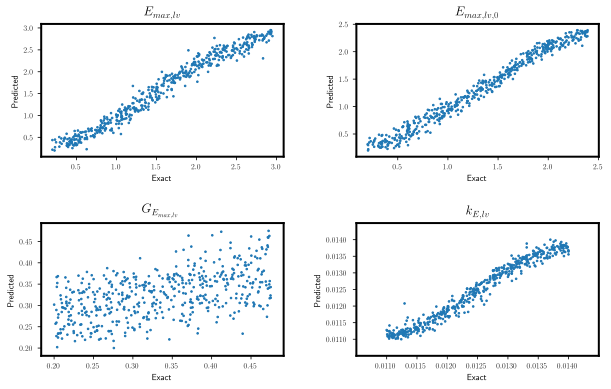

In [20]:
plot_dnn_performance(artificial_pulse=True, RPM=5000)

In [21]:
get_results_table(artificial_pulse=True, RPM=5000)

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,CI,PCPW
Min exact,62.50,75.15,90.12,67.66,15.34,26.63,9.69,30.81,126.54,33.37,0.39,5.10
Max exact,78.43,101.90,133.31,86.21,23.56,31.72,19.48,74.88,204.56,137.98,1.90,16.15
Mean exact,66.95,92.86,120.31,79.13,17.70,28.15,12.48,56.99,152.83,67.33,-1.53,8.32
SD exact,3.31,5.82,9.36,4.13,1.50,0.95,1.79,9.96,17.28,23.17,0.30,2.06
Min predicted,62.50,73.53,87.03,66.79,15.28,26.59,9.63,30.57,126.83,33.61,0.26,4.99
Max predicted,87.17,101.91,133.67,86.25,23.74,31.90,19.66,73.50,206.98,132.06,1.90,16.69
Mean predicted,67.04,92.71,119.96,79.09,17.70,28.15,12.48,56.93,153.63,67.89,-1.52,8.35
SD predicted,3.57,6.13,9.87,4.33,1.55,0.98,1.84,10.14,18.46,23.99,0.32,2.15
Mean error matrix,0.52,0.47,0.78,0.43,0.11,0.08,0.14,1.39,2.04,2.72,0.03,0.16
Mean rel error * 100,0.77,0.52,0.68,0.55,0.64,0.28,1.06,2.58,1.27,4.01,2.43,1.82


## RPM = 6000

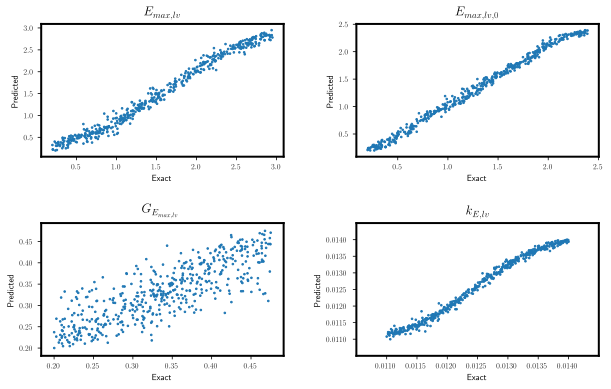

In [22]:
plot_dnn_performance(artificial_pulse=True, RPM=6000)

In [23]:
get_results_table(artificial_pulse=True, RPM=6000)

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,CI,PCPW
Min exact,62.50,75.53,89.81,68.39,15.34,26.62,9.70,29.62,126.82,32.84,0.44,5.04
Max exact,78.43,101.94,133.20,86.31,23.04,31.42,18.84,75.18,215.48,151.66,1.90,15.66
Mean exact,67.11,92.57,119.86,78.93,17.79,28.21,12.58,56.49,153.38,68.36,-1.51,8.44
SD exact,3.39,5.97,9.69,4.20,1.54,0.96,1.83,10.06,17.34,23.69,0.31,2.11
Min predicted,62.50,73.82,86.91,67.28,15.34,26.62,9.70,30.85,125.91,33.10,0.29,5.04
Max predicted,87.28,101.77,133.15,86.30,23.66,31.81,19.59,74.24,216.10,149.02,1.89,16.51
Mean predicted,67.19,92.54,119.74,78.93,17.83,28.24,12.63,56.72,152.76,67.95,-1.50,8.50
SD predicted,3.76,6.33,10.41,4.37,1.64,1.04,1.95,10.74,18.41,25.34,0.34,2.28
Mean error matrix,0.55,0.50,0.84,0.45,0.13,0.10,0.15,1.61,1.65,2.95,0.03,0.18
Mean rel error * 100,0.81,0.55,0.73,0.58,0.70,0.34,1.12,2.99,1.07,4.46,2.45,2.00


## DNN performance with pulsatile flow at different RPM levels



In [24]:
# We load the DNN responses into a dataframe
# Columns: 4 parameters * 2 (pred/exact) + Art_Pulse + RPM
Y = pd.DataFrame(columns=dnnperf_params_ + ['art_pulse', 'RPM'])
for artificial_pulse, pathdic in results_folders.items():
    for rpm in pathdic:
        print(artificial_pulse, rpm)
        Ytest, Ypred = load_Ys(artificial_pulse, rpm)
        Yjoin = Ytest.join(Ypred, rsuffix='_pred')
        Yjoin['RPM'] = rpm
        Yjoin['art_pulse'] = artificial_pulse
        Y = pd.concat([Y, Yjoin])

Y.reset_index(drop=True, inplace=True)

False 4000
False 5000
False 6000
False 0
True 4000
True 5000
True 6000


In [25]:
Y

,Emax,Emax0,G_Emax,k_E,art_pulse,RPM,Emax_pred,Emax0_pred,G_Emax_pred,k_E_pred
0,2.25,2.11,0.44,0.01,False,4000,2.28,2.18,0.37,0.01
1,1.03,1.25,0.25,0.01,False,4000,1.02,1.16,0.27,0.01
2,1.81,1.24,0.35,0.01,False,4000,1.76,1.20,0.32,0.01
3,1.05,0.62,0.28,0.01,False,4000,0.85,0.46,0.33,0.01
4,1.64,0.98,0.42,0.01,False,4000,1.43,0.91,0.40,0.01
...,...,...,...,...,...,...,...,...,...,...
3494,1.17,0.28,0.39,0.01,True,6000,0.81,0.28,0.41,0.01
3495,2.64,2.37,0.31,0.01,True,6000,2.61,2.34,0.31,0.01
3496,1.46,0.37,0.39,0.01,True,6000,1.37,0.36,0.35,0.01
3497,0.43,1.96,0.29,0.01,True,6000,0.54,2.02,0.33,0.01


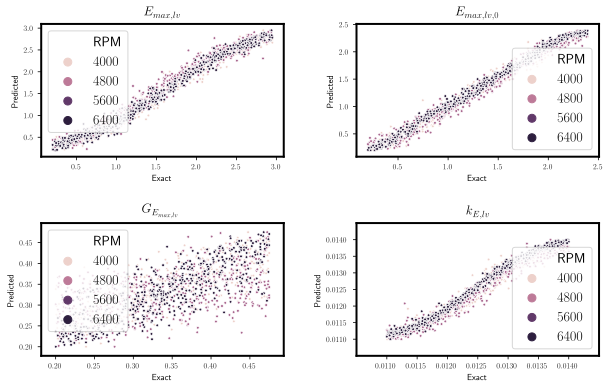

In [26]:
fig, ax = plt.subplots(2, 2, figsize=(10,6))
axlst = ax.ravel()

for i,col in enumerate(dnnperf_params_):
    sns.scatterplot(x=col, y=col+'_pred',
                    data=Y[Y.art_pulse==True],
                    s=8, hue='RPM', ax=axlst[i])
    axlst[i].set_title(dnnperf_params[i])
    axlst[i].set_xlabel(r'Exact')
    axlst[i].set_ylabel(r'Predicted')

offset = .0005
ax[1, 1].set_xlim([Y['k_E'].min()-offset, Y['k_E'].max()+offset])
ax[1, 1].set_ylim([Y['k_E'].min()-offset, Y['k_E'].max()+offset])

plt.subplots_adjust(wspace=0.3, hspace=.5)

## Predicted vs exact hemodynamic quantities under pulsatile flow conditions

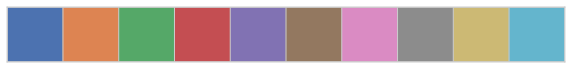

In [272]:
sns.palplot(sns.color_palette())

In [277]:
def plt_compare(data, col, ax, legend=None):
    # Plot identity line
    coord1 = min(data[col].min(), data[col+'_hat'].min())
    coord2 = max(data[col].max(), data[col+'_hat'].max())
    ax.plot([coord1, coord2], [coord1, coord2], '--k')
    # Scatter plot predicted vs exact
    sns.scatterplot(x=col, y=col+'_hat', data=data, ax=ax, hue='RPM',
                    legend=legend, palette=sns.color_palette()[:3])
    ax.set_xlabel('$'+col+'$')
    ax.set_ylabel('$\widehat{' + col + '}$')

In [278]:
fig, ax = plt.subplots(4, 3, figsize=(12, 15))
axlst = ax.ravel()

for i, col in enumerate(cols):
    plt_compare(X[X.art_pulse==True], col, axlst[i], 'full' if i == 1 else None)
plt.subplots_adjust(wspace=.3, hspace=.3)
sns.despine()

# Pulsatile vs continuous flow

## Hemodynamic quantities distribution

We plot the relative distribution of some hemodynamic quantities to show that a given quantity has the same distribution irrespective of the RPM level, under pulsatile flow conditions.

In [107]:
def load_X_data(artificial_pulse, RPM):
    Xhat = pd.read_csv(results_folders[artificial_pulse][RPM]+file_names['Xpred'], header=None)
    X = pd.read_csv(results_folders[artificial_pulse][RPM]+file_names['Xexact'], header=None)
    # Format columns
    cols = [
        'HR','SAPM','SAPS','SAPD', 'PAPM','PAPS','PAPD','LVEF',
        'LVEDV', 'LVESV', 'CI', 'PCPW'
    ]
    Xhat.columns = cols
    X.columns = cols
    # Take abs (values of cardiac index are negative)
    X.CI = X.CI.apply(np.abs)
    Xhat.CI = Xhat.CI.apply(np.abs)
    # Join
    X = X.join(Xhat, rsuffix='_hat')
    # Specify 'context parameters'
    X['RPM'] = RPM
    X['art_pulse'] = artificial_pulse
    print(artificial_pulse, rpm)
    return X

In [112]:
X = []
for artificial_pulse in results_folders:
    for rpm in results_folders[artificial_pulse]:
        X.append(load_X_data(artificial_pulse, rpm))

X = pd.concat(X)
X.reset_index(drop=True, inplace=True)

False 4000
False 5000
False 6000
False 0
True 4000
True 5000
True 6000


In [113]:
X

,HR,SAPM,SAPS,SAPD,PAPM,PAPS,PAPD,LVEF,LVEDV,LVESV,...,PAPM_hat,PAPS_hat,PAPD_hat,LVEF_hat,LVEDV_hat,LVESV_hat,CI_hat,PCPW_hat,RPM,art_pulse
0,65.22,90.85,122.58,74.99,18.25,29.20,12.77,58.17,142.95,59.80,...,18.12,28.99,12.68,58.83,141.98,58.45,2.06,8.68,4000,False
1,62.50,94.70,126.60,78.76,16.72,28.00,11.08,57.53,158.08,67.13,...,16.66,28.01,10.99,58.47,156.19,64.86,2.12,6.81,4000,False
2,65.22,92.61,126.44,75.70,18.19,29.00,12.79,54.78,149.25,67.49,...,18.17,28.96,12.78,54.44,150.27,68.46,2.19,8.47,4000,False
3,62.50,93.79,126.44,77.46,17.36,28.54,11.77,58.57,148.72,61.61,...,17.19,28.38,11.59,58.97,149.55,61.37,2.05,7.45,4000,False
4,62.50,94.98,128.96,77.99,17.53,28.49,12.05,53.21,162.69,76.12,...,17.49,28.58,11.95,54.27,161.84,74.01,2.24,7.39,4000,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3495,63.49,99.84,130.09,84.71,15.73,26.75,10.22,62.60,143.50,53.66,...,15.77,26.78,10.26,63.46,141.57,51.73,1.77,5.65,6000,True
3496,64.52,97.29,128.79,81.54,16.90,27.83,11.44,65.06,146.39,51.15,...,16.73,27.65,11.27,63.35,142.96,52.39,1.82,6.96,6000,True
3497,63.49,101.94,133.20,86.31,15.36,26.64,9.73,72.79,138.67,37.73,...,15.37,26.63,9.74,71.86,139.83,39.34,1.86,5.15,6000,True
3498,71.43,85.34,107.67,74.18,19.71,29.27,14.93,43.27,167.05,94.78,...,19.82,29.31,15.08,44.67,168.10,93.02,1.04,11.28,6000,True


In [135]:
X.rename({'SAPM_hat':'SAPMhat'}, axis=1).columns

Index(['HR', 'SAPM', 'SAPS', 'SAPD', 'PAPM', 'PAPS', 'PAPD', 'LVEF', 'LVEDV',
       'LVESV', 'CI', 'PCPW', 'HR_hat', 'SAPMhat', 'SAPS_hat', 'SAPD_hat',
       'PAPM_hat', 'PAPS_hat', 'PAPD_hat', 'LVEF_hat', 'LVEDV_hat',
       'LVESV_hat', 'CI_hat', 'PCPW_hat', 'RPM', 'art_pulse'],
      dtype='object')

In [151]:
def fix_hat(df, col):
    return df.rename({col+'_hat':col+'hat'}, axis=1)

In [252]:
def filter_data(df, art_pulse, rpm, col):
    return df.loc[ (df.art_pulse == art_pulse) & (df.RPM == rpm), col ]

In [258]:
def setup_kde_ax(ax):
    unspine = ['left', 'right', 'top']
    for s in unspine:
        ax.spines[s].set_visible(False)
    
    ax.set_yticks([])
    #ax.text(0, 0.1, axname, transform=ax.transAxes)
    ax.get_legend().remove()
    ax.grid(False)

In [254]:
def plot_kde_for_col(col, ax1, ax2):
    sns.kdeplot(data=filter_data(X, False, 4000, col), ax=ax1)
    sns.kdeplot(data=filter_data(X, False, 5000, col), ax=ax1)
    sns.kdeplot(data=filter_data(X, False, 6000, col), ax=ax1)
    sns.kdeplot(data=filter_data(X, True, 4000, col), ax=ax2)
    sns.kdeplot(data=filter_data(X, True, 5000, col), ax=ax2)
    sns.kdeplot(data=filter_data(X, True, 6000, col), ax=ax2)
    ax1.set_xticks([])
    
    #setup_kde_ax(ax1, 'CF')
    #setup_kde_ax(ax2, 'PF')
    setup_kde_ax(ax1)
    setup_kde_ax(ax2)
    ax1.legend(['4000', '5000', '6000'], title='RPM', loc='upper left')
    ax1.set_title('Continuous')
    ax2.set_title('Pulsatile')
    plt.suptitle(col)

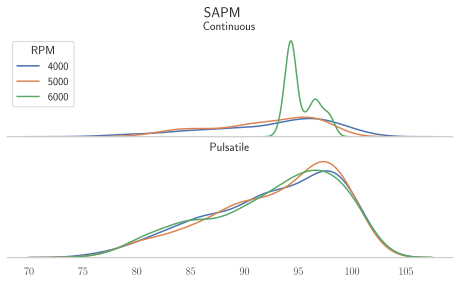

In [266]:
fig = plt.figure(figsize=(8,4))
gs = GridSpec(nrows=2, ncols=1, figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

plot_kde_for_col('SAPM', ax1, ax2)

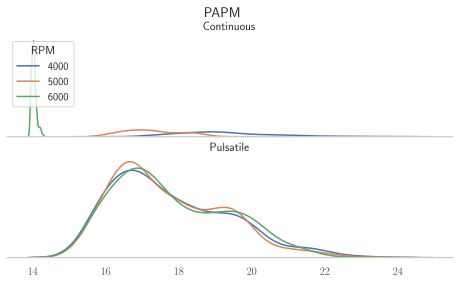

In [267]:
fig = plt.figure(figsize=(8,4))
gs = GridSpec(nrows=2, ncols=1, figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

plot_kde_for_col('PAPM', ax1, ax2)

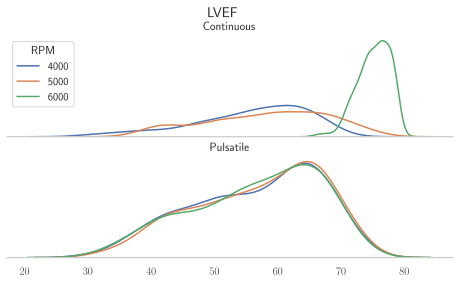

In [268]:
fig = plt.figure(figsize=(8,4))
gs = GridSpec(nrows=2, ncols=1, figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

plot_kde_for_col('LVEF', ax1, ax2)

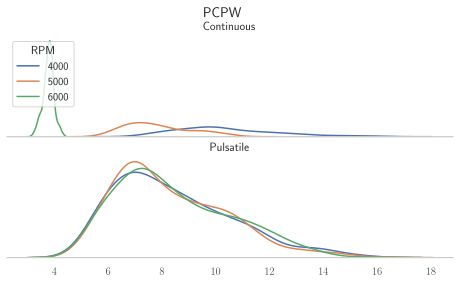

In [281]:
fig = plt.figure(figsize=(8,4))
gs = GridSpec(nrows=2, ncols=1, figure=fig)

ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

plot_kde_for_col('PCPW', ax1, ax2)

## Compare DNN performance

### Mean squared error of the 4 parameters

In [27]:
# Add a column squared error for each parameter
for col in dnnperf_params_:
    Y[col + '_sqerr'] = np.power((Y[col] - Y[col + '_pred']), 2)

In [28]:
sns.set(style='whitegrid')

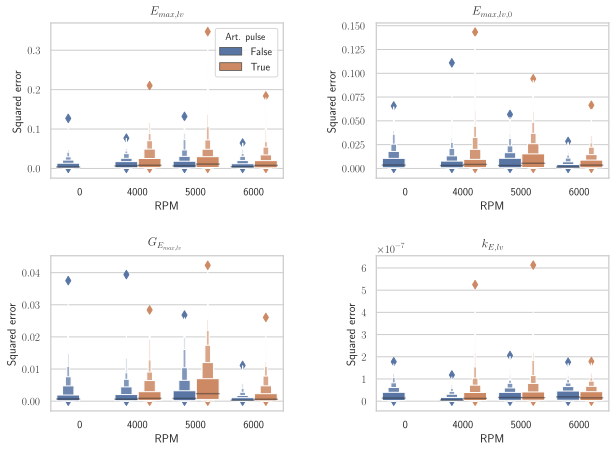

In [247]:
# Stackoverflow: assign a color to a specific box in seaborn.boxplot
# https://stackoverflow.com/a/36331317

fig, ax = plt.subplots(2, 2, figsize=(10, 7))
axlst = ax.ravel()

for i, col in enumerate(dnnperf_params_):
    p = sns.boxenplot(x='RPM', y=col+'_sqerr', hue='art_pulse', 
                    data=Y, ax=axlst[i], dodge=True)
    axlst[i].set_ylabel('Squared error')
    axlst[i].set_title(dnnperf_params[i])
    # Manage legend
    if i == 0:
        axlst[i].get_legend().set_title('Art. pulse')
    else:
        axlst[i].get_legend().remove()
    # Manage color of box without LVAD
    #box_nolvad = p.artists[0]
    #box_nolvad.set_facecolor(sns.color_palette()[2])
    #box_nolvad.set_sketch_params(scale=0)
        
plt.subplots_adjust(wspace=.4, hspace=.5)

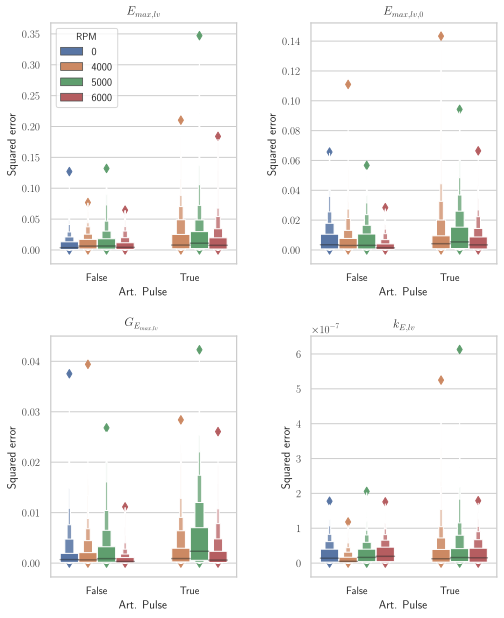

In [54]:
# Stackoverflow: assign a color to a specific box in seaborn.boxplot
# https://stackoverflow.com/a/36331317

fig, ax = plt.subplots(2, 2, figsize=(8, 10))
axlst = ax.ravel()

for i, col in enumerate(dnnperf_params_):
    p = sns.boxenplot(x='art_pulse', y=col+'_sqerr', hue='RPM', 
                    data=Y, ax=axlst[i], dodge=True)
    axlst[i].set_xlabel('Art. Pulse')
    axlst[i].set_ylabel('Squared error')
    axlst[i].set_title(dnnperf_params[i])
    # Manage legend
    if i == 0:
        pass
        #axlst[i].get_legend().set_title('RPM')
    else:
        axlst[i].get_legend().remove()
    # Manage color of box without LVAD
    #box_nolvad = p.artists[0]
    #box_nolvad.set_facecolor(sns.color_palette()[2])
    #box_nolvad.set_sketch_params(scale=0)
        
plt.subplots_adjust(wspace=.4, hspace=.3)

In [66]:
# We build a table for mean squared errors
mse_columns = [['Continuous', 'Pulsatile'], dnnperf_params_]
mse_columns = pd.MultiIndex.from_product(mse_columns, names=['Flow', 'Parameter'])
Ymse = pd.DataFrame(columns=mse_columns)
Ymse

Empty DataFrame
Columns: [(Continuous, Emax), (Continuous, Emax0), (Continuous, G_Emax), (Continuous, k_E), (Pulsatile, Emax), (Pulsatile, Emax0), (Pulsatile, G_Emax), (Pulsatile, k_E)]
Index: []

In [84]:
Ymse = Y.groupby(['art_pulse', 'RPM']).mean()
Ymse = Ymse[ [col+'_sqerr' for col in dnnperf_params_] ]
Ymse.columns = [col for col in dnnperf_params_]

In [87]:
Ymse.index.rename(['Artificial Pulse', 'RPM'], inplace=True)

In [88]:
Ymse.rename(dict(zip(dnnperf_params_,dnnperf_params)), axis=1)

$E_{max,lv}$  $E_{max,lv,0}$  $G_{E_{max,lv}}$  \
Artificial Pulse RPM                                                    
False            0         8.97e-03        7.46e-03          2.00e-03   
                 4000      1.12e-02        6.05e-03          1.85e-03   
                 5000      1.41e-02        7.08e-03          2.77e-03   
                 6000      8.55e-03        3.07e-03          8.26e-04   
True             4000      1.93e-02        8.95e-03          2.53e-03   
                 5000      2.33e-02        1.09e-02          5.02e-03   
                 6000      1.57e-02        6.53e-03          1.96e-03   

                       $k_{E,lv}$  
Artificial Pulse RPM               
False            0       2.60e-08  
                 4000    1.25e-08  
                 5000    2.66e-08  
                 6000    2.92e-08  
True             4000    3.16e-08  
                 5000    3.52e-08  
                 6000    2.79e-08

In [89]:
Ymse.transpose()

Artificial Pulse     False                                   True             \
RPM                   0         4000      5000      6000      4000      5000   
Emax              8.97e-03  1.12e-02  1.41e-02  8.55e-03  1.93e-02  2.33e-02   
Emax0             7.46e-03  6.05e-03  7.08e-03  3.07e-03  8.95e-03  1.09e-02   
G_Emax            2.00e-03  1.85e-03  2.77e-03  8.26e-04  2.53e-03  5.02e-03   
k_E               2.60e-08  1.25e-08  2.66e-08  2.92e-08  3.16e-08  3.52e-08   

Artificial Pulse            
RPM                   6000  
Emax              1.57e-02  
Emax0             6.53e-03  
G_Emax            1.96e-03  
k_E               2.79e-08

In [90]:
# Idea for plot of table for MSE:
# group data in a different way, put a column 'param' being Emax, Emax0, ...
# and basically make a catplot with col='param'

### Relative error of hemodynamic quantities

In [221]:
cols = [
    'HR','SAPM','SAPS','SAPD',
    'PAPM','PAPS','PAPD','LVEF',
    'LVEDV', 'LVESV', 'CI', 'PCPW'
]

In [223]:
for col in cols:
    X[col+'_relerr'] = np.abs(X[col] - X[col+'_hat']) / X[col] * 100

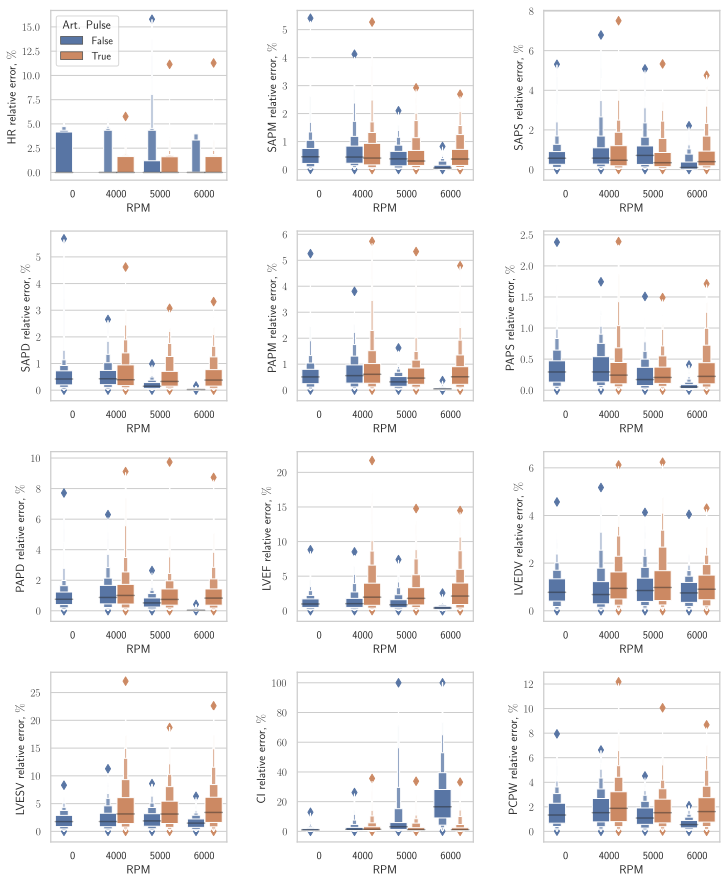

In [245]:
fig, ax = plt.subplots(4, 3, figsize=(12, 15))
axlst = ax.ravel()
sns.set(style='whitegrid')

for i, col in enumerate(cols):
    if col == 'CI':
        data = X[X.CI_relerr < 100]
    else:
        data = X
        
    sns.boxenplot(x='RPM', y=col+'_relerr', data=data, ax=axlst[i], hue='art_pulse')
    axlst[i].set_ylabel(col + r' relative error, $\%$')
    if i == 0:
        axlst[i].legend(title='Art. Pulse', loc='upper left')
    else:
        axlst[i].get_legend().remove()

plt.subplots_adjust(wspace=.4, hspace=.3)